# Case Study 1: From Exploration to Design

- Name: Ella Ilan
- Student ID: 76021690
- Link to GitHub Repository: https://github.com/ellailan/smartwatches-distracted-driving/


In [64]:
devtools::install_github("lbelzile/hecedsm")
install.packages('tidyverse')
install.packages('wesanderson')


Skipping install of 'hecedsm' from a github remote, the SHA1 (df0a5444) has not changed since last install.
  Use `force = TRUE` to force installation

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done



In [65]:
library(tidyverse)
library(hecedsm)

##my own package for color palettes
library(wesanderson)

> Choose one of the studies of your choice from the options above. Download the paper from the provided link and load data in R. (Mechanics: 5 points)

Let's load in our dataset.

In [66]:
driving_distraction <- BRLS21_EDA

> Read the paper and summarize goals of study. Write your summary in no more than 200 words and be sure to clearly explain: (Reasoning: 10 points)

## Understanding the Research Paper
#### *Smartwatches are more distracting than mobile phones while driving*, Brodeur et al. (2021)





This research paper aimed to better understand different sources of distracted driving. It sought to differentiate between the impact of smartwatches and smartphones, as well as to better understand if there’s a difference in distraction between inbound and outbound messages, or when sent through text or through voice messaging.

The experiment consisted of 31 participants in a driving simulator. Distraction was measured through eye-tracking gaze distribution and driving performance, across four main conditions. 
<br>
1. Receiving notifications on a mobile phone, answering orally. 
2. Receiving notifications on a smartwatch, answering orally.
3. Receiving notifications by speaker, answering orally.
4. Receiving notifications in a “texting” condition by either phone or watch, where they had to reply through texting to the notifications.
<br>
Each participant took part in several conditions. Results showed that distracted gaze was the worst in the texting condition, then in smartwatches, then in the phone. The least distracted gaze was found when notifications were played aloud through a speaker. Driving performance was the same in all conditions but the texting one, in which performance declined. Overall, this paper suggests that audio reception and vocal transmission of text is safer while driving, and that smartwatches may pose a greater risk to vehicle safety than is currently commonly understood. This research may support broader road safety campaigns targeting smart-watches or encouraging the use of text-to-speech, speech-to-text capabilities on the road. 



> Use the glimpse() or head() function to examine your dataset. How many observations and variables are there in the dataset? (Writing: 1 point) What type of variables are in the dataset? (i.e numerical vs. categorical). Explain briefly. (Writing: 1 point) Would you need to convert any variable in the dataset before starting your analysis? Explain briefly why or why not. (Reasoning: 2 points)

## Exploring the Data

Let's investigate our driving_distraction using the glimpse() function to better understand the research.

In [67]:
glimpse(driving_distraction)

Rows: 10,942
Columns: 6
$ id        <fct> 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, …
$ reltime   <int> 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17…
$ task      <fct> baseline, baseline, baseline, baseline, baseline, baseline, …
$ occurence <int> 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, …
$ eda       <dbl> 20.60959, 21.41062, 22.26244, 24.22100, 24.23851, 23.63703, …
$ hr        <dbl> 88.49560, 88.31564, 78.13892, 65.82009, 65.13290, 66.83456, …


#### Our dataset contains six variables, for which there are 10,942 observations.  They are: <br>

`id`: participant identifier, *a factor and categorical variable*
<br>
`reltime`: relative time of the task, *an integer and numerical variable*
<br>
`task`: either baseline or a distraction, as defined in the previous description, *a factor and categorical variable*
<br>
`occurence`: number of occurrences, *an integer and a numerical variable*
<br>
`eda`: electrodermal activity measure, *a double and a numerical variable*. (This is a measure of skin's electrical properties due to sweat, used often to quantify stress.)
<br>
`hr`: heart rate, *a double and a numerical variable*

<br>

These driving_distraction types all align neatly with the type of variable they represent (`factor` for categories, `dbl` or `float` or `integer` for numerical measurements). As such, we can move forward without converting any driving_distraction types. 

<br>

> How many missing values are there for each variable in the dataset? Are there any variables with a large proportion of missing data (e.g., more than 20%)? (Writing: 2 points)

Let's investigate to see if we have any missing values, and at what proportions. 

In [68]:
na_count <- driving_distraction |>
  summarize(across(everything(), ~ sum(is.na(.))))

na_prop <- driving_distraction |>
    summarize(across(everything(), ~ mean(is.na(.)))) |>
    pivot_longer(everything(),
               names_to = "variable",
               values_to = "prop_missing") |>
    mutate(prop_missing = prop_missing*100) #so we can see percentages!

na_count
na_prop

id,reltime,task,occurence,eda,hr
<int>,<int>,<int>,<int>,<int>,<int>
0,0,0,0,214,538


variable,prop_missing
<chr>,<dbl>
id,0.000000
reltime,0.000000
task,0.000000
occurence,0.000000
eda,1.955767
hr,4.916834


The only variables with NA values are `eda` and `hr`. Since these are derived from sensor measurements, it’s likely the missing values resulted from manual data collection errors. Though there are 214 missing `eda` measurements and 538 missing `hr` ones, that these only make up 1.955% and 4.915% of their respective variables. This is a small proportion, so we can move forward.

<br>

> Is there evidence of class imbalance in any categorical variable in the dataset (e.g., one category makes up a large majority of the observations)? (Reasoning: 2 points)

We're interested in seeing if there are any class imbalances in our dataset. There's only one categorical variable that represents "class" (the other is simply used for identification). Let's take a look at the distribution across classes in the variable `task`. 

In [69]:
classes <- driving_distraction |>
    select(task) |>
    pivot_longer(everything(),
               names_to = "variable",
               values_to = "category") |>
    count(variable, category) |>
    group_by(variable) |>
    mutate(prop = n / sum(n)) |>
    arrange(variable, desc(prop)) 

class_imbalance <- classes |> filter(prop >= 0.25)

class_imbalance

variable,category,n,prop
<chr>,<fct>,<int>,<dbl>
task,watch,3786,0.3460062
task,cell,3028,0.2767319
task,baseline,2736,0.2500457


There's a slight class imbalance, with a larger number of voicecall trials. We will investigate this ```classes``` dataframe more later in the case study.

## Data Visualization 

### Numerical Variables
> Select two numerical variables from the dataset and name them here. What type of plot would be appropriate to explore the relationship between these two variables? Write the R code to produce this plot. Describe any pattern you observe. 

Let's consider two numerical variables `hr`, heart rate, and `eda`, electrodermal activity. Both are used to quantify stress response. 

Warning message:
“Removed 739 rows containing missing values or values outside the scale range
(`geom_point()`).”


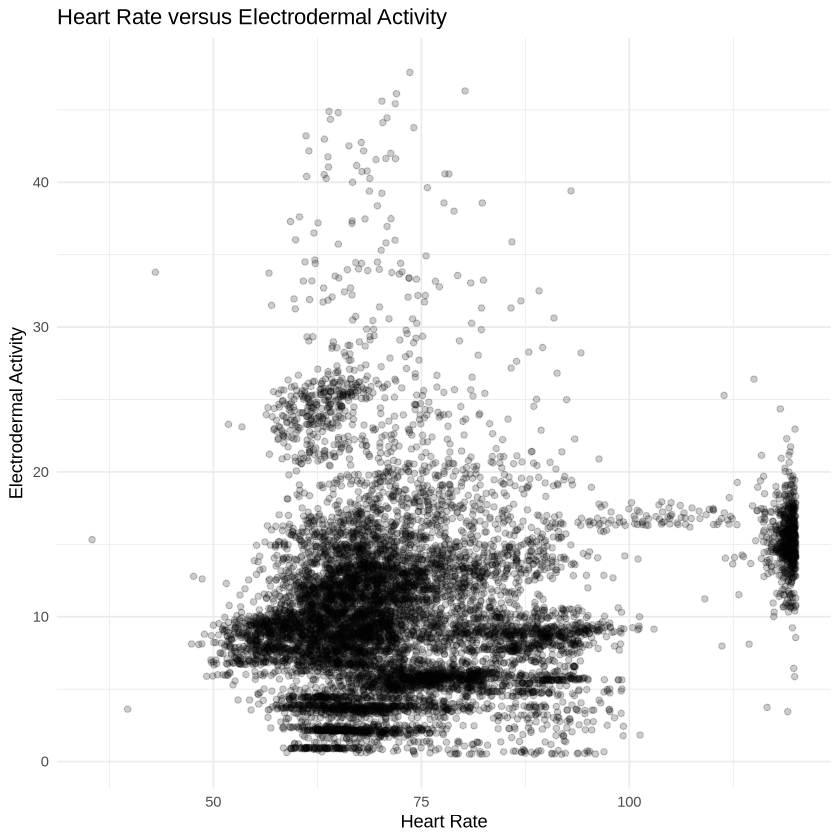

In [70]:
hr_v_eda <- driving_distraction |> ggplot(aes(x = hr, y = eda)) + geom_point(alpha = 0.2) +
                    labs(title = "Heart Rate versus Electrodermal Activity",
                        x = "Heart Rate", y = "Electrodermal Activity") +
                        theme_minimal()
hr_v_eda

There isn't an apparent relationship between heart rate and electrodermal activity. In fact, we can investigate on a case-by-case basis by coloring by `id`, and differentiating each unique experiment participant.


Warning message:
“Removed 739 rows containing missing values or values outside the scale range
(`geom_point()`).”


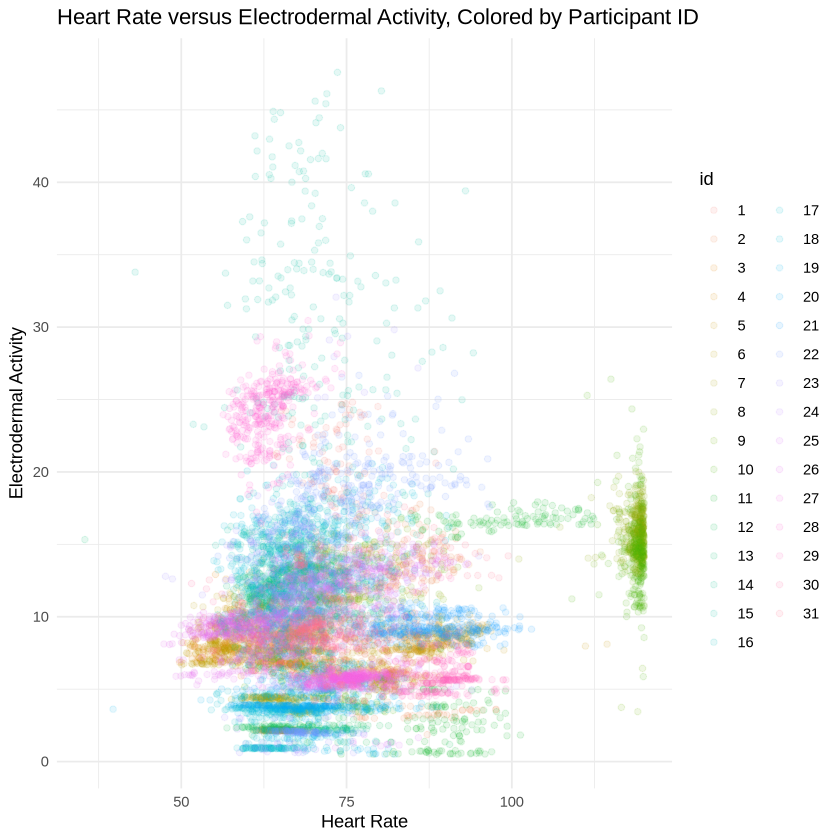

In [71]:
hr_v_eda_colored <- driving_distraction |> ggplot(aes(x = hr, y = eda, color = id)) + geom_point(alpha = 0.1) +
                    labs(title = "Heart Rate versus Electrodermal Activity, Colored by Participant ID",
                        x = "Heart Rate", y = "Electrodermal Activity") +
                        theme_minimal()
hr_v_eda_colored

The straight-line clusters of horizontal dots suggest that there is no change in electrodermal activity for a change in heart rate for that specific user; i.e. that electrodermal activity seems to be unique per participant and not related to heartrate. 

We can color by `task` and see that there isn't any apparent clustering or pattern by task type, either. This further suggests that `eda` and `hr` are unique to participants and not affected by the experiment.  

Warning message:
“Removed 739 rows containing missing values or values outside the scale range
(`geom_point()`).”


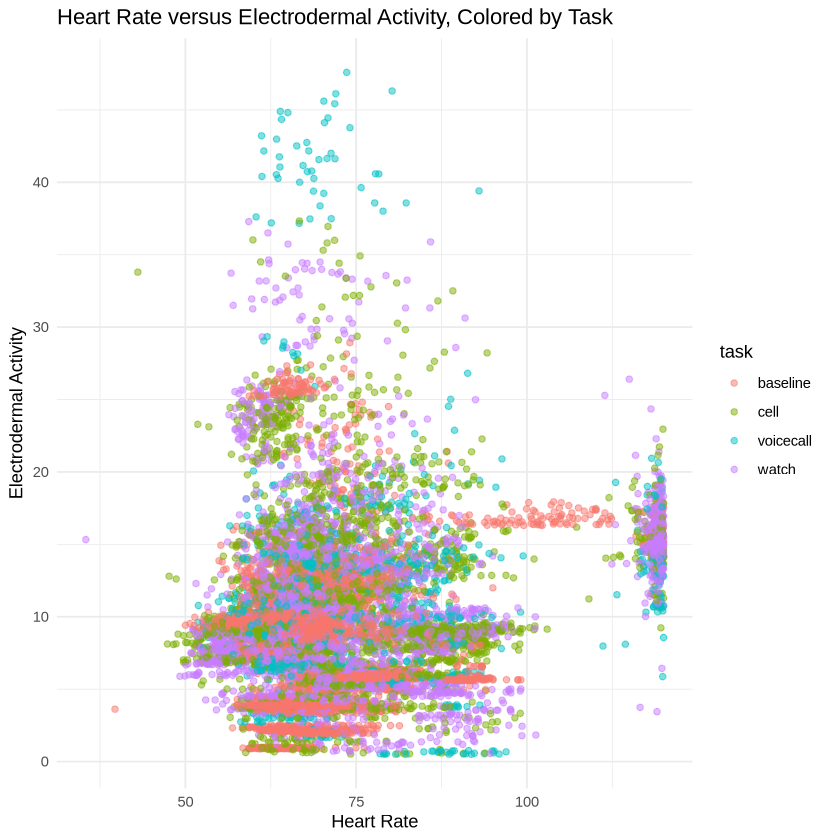

In [72]:
hr_v_eda_bytask <- driving_distraction |> ggplot(aes(x = hr, y = eda, color = task)) + geom_point(alpha = 0.5) +
                    labs(title = "Heart Rate versus Electrodermal Activity, Colored by Task",
                        x = "Heart Rate", y = "Electrodermal Activity") +
                        theme_minimal()
hr_v_eda_bytask

### Distribution of a Numerical Variable

> Create an appropriate plot to show the distribution of one numerical variable in the dataset. What does the distribution tell you about the variable? What is a typical observation from this distribution? (Reasoning: 2.5 points + Coding: 2.5 points)

<br>

Let's investigate the distribution of the `eda`, electrodermal activity, variable.

Warning message:
“Removed 214 rows containing non-finite outside the scale range (`stat_bin()`).”


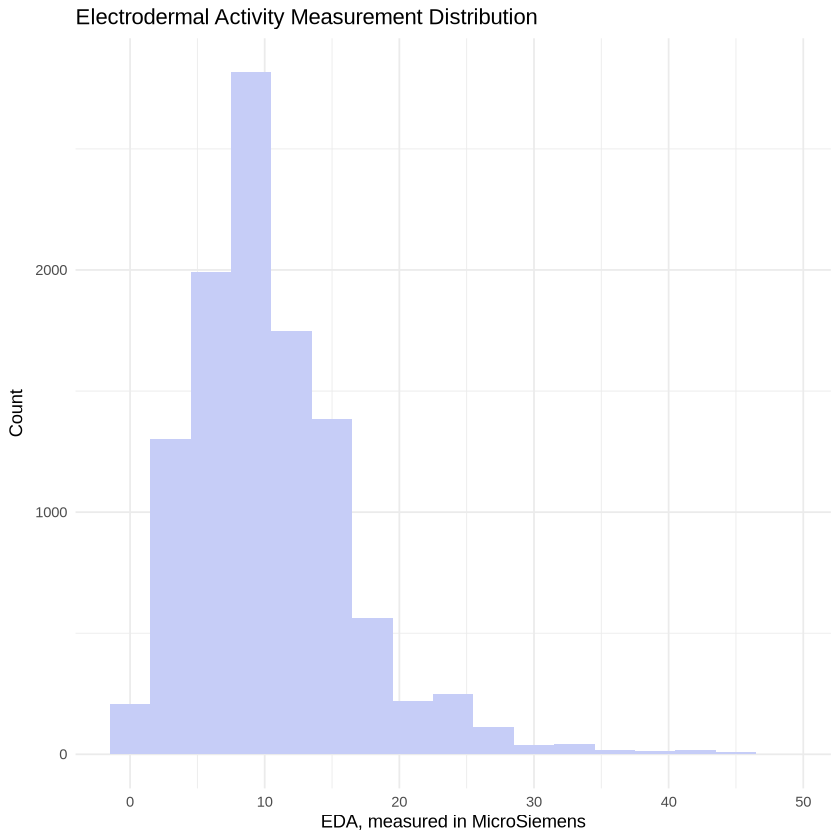

In [73]:
eda_histogram <- driving_distraction |>
    ggplot(aes(x = eda)) +
    geom_histogram(binwidth = 3, fill = wesanderson::wes_palette("GrandBudapest2")[2]) +
    labs(title = "Electrodermal Activity Measurement Distribution",
    x = "EDA, measured in MicroSiemens",
    y = "Count") +
    theme_minimal()

eda_histogram

This is a slightly right-skewed distribution, with a typical observation between 9 and 12. This suggests that typical electrodermal activity levels are moderate, and high values occur less frequently. 

[According to one source](https://www.biopac.com/wp-content/uploads/EDA-Guide.pdf), typical measurements for resting EDA are between 1 and 20 MicroSiemens, and very few participants in our experiment have recorded `eda` above 20. Considering both the histogram and scatterplot above, `eda` does not seem to have successfully captured any meaningful stress response and stayed relatively consistent per participant. 

### Numerical and Categorical Variable

> Pick one numerical and one categorical variable from your dataset. Using an appropriate plot, what insights can you draw about the relationship between these two variables? (Reasoning: 2.5 points + Coding: 2.5 points)


Let's investigate the distribution of the `hr`, heart rate, variable, when we consider `task`, the category of task of participants.

Warning message:
“Removed 538 rows containing non-finite outside the scale range
(`stat_boxplot()`).”


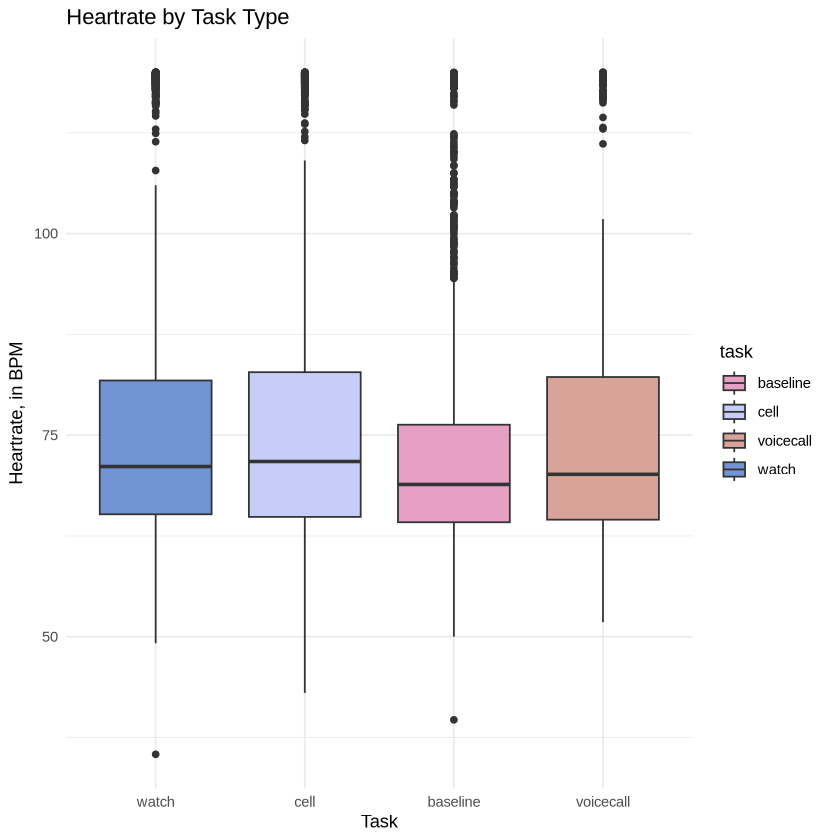

In [74]:
hr_task_plot <- driving_distraction |>
  ggplot(aes(x = fct_infreq(task), y = hr, fill = task)) +
  geom_boxplot() +
  scale_fill_manual(values = wesanderson::wes_palette("GrandBudapest2")) +
  labs(title = "Heartrate by Task Type",
    x = "Task",
    y = "Heartrate, in BPM") +
    theme_minimal()

hr_task_plot

This boxplot shows median heart rate levels that are nearly identical across tasks, with the baseline only being slightly lower. The 25th percentile is similarly nearly identical across tasks. We see the most measurable difference in the 75th percentile, which is noticeably lower in the baseline and highest in the cellphone task. Outlying values in both the upper and lower bound reach nearly the same point as well.

### Distribution of a Categorical Variable

> Create an appropriate plot to show the distribution of one categorical variable in the dataset. What does the distribution tell you about the variable? Is there a “typical” value? (Reasoning: 2.5 points + Coding: 2.5 points)

Let's consider the distribution of the `task` variable, the category of tasks.

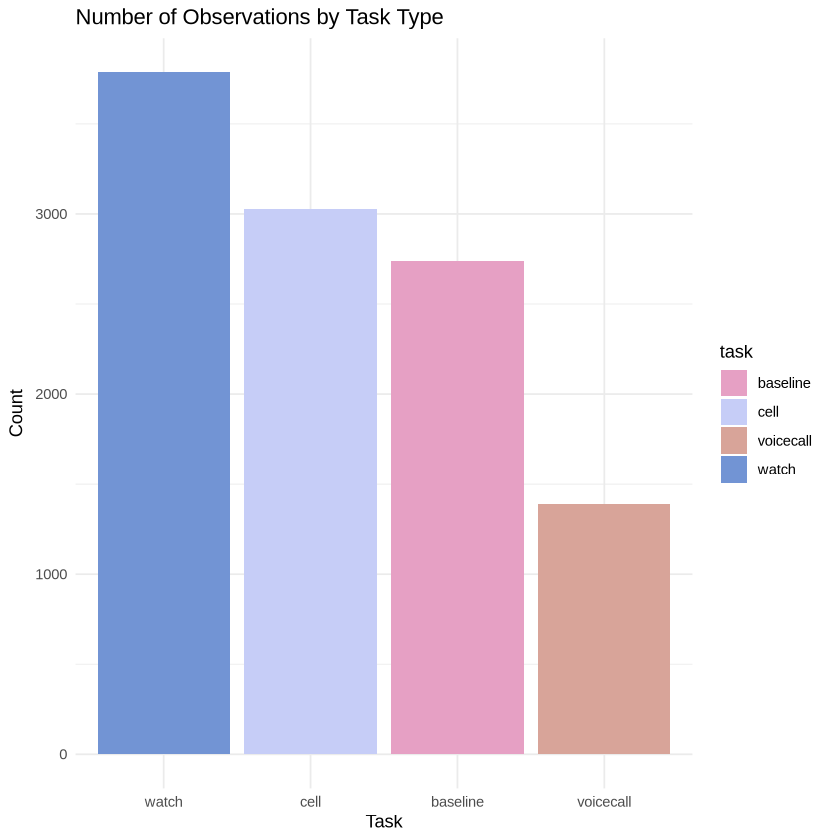

In [75]:
task <- driving_distraction |>
  ggplot(aes(x = fct_infreq(task), fill = task)) +
  geom_bar() +
    scale_fill_manual(values = wesanderson::wes_palette("GrandBudapest2")) +
  labs(title = "Number of Observations by Task Type",
    x = "Task",
    y = "Count") +
    theme_minimal()

task

This graph further represents the class imbalance of measurements in this experiment, as previously explored in classes. More participants took part in the watch experiment than any other task, making it the typical measurement. Significantly fewer participants took part in the voice call experiments.

This stands out to me because the experiment claimed to be within-subject, ie. that every participant took part in every condition, as a form of control variable. This isn't reflected in the dataset.


## Summary Statistics
Let's compute some summary statistics to help us better understand the graphs above.

### Numerical Variable

> Choose one numerical variable from your dataset. Report an appropriate measure of central tendency and explain why this measure is appropriate for the variable you selected. (Reasoning: 3 points + Coding: 2 points)


Let's consider `eda` again, as we graphed its histogram earlier.

In [76]:
eda_summary <- driving_distraction |>
  summarize(mean = mean(eda, na.rm = TRUE),
    median = median(eda, na.rm = TRUE), 
    min = min(eda, na.rm = TRUE),
    max = max(eda, na.rm = TRUE))

eda_summary

mean,median,min,max
<dbl>,<dbl>,<dbl>,<dbl>
10.39493,9.366185,0.50354,47.58981


Since our distribution of electrodermal activity was right-skewed, these summaries make sense. The right leaning tail makes the mean greater than the median. For a skewed distribution, we would prefer to report the **median** as a measure of central tendency, as it is more resistant to those outlying values that make up the distribution tail.

### Categorical Variable

> Choose one categorical variable from your dataset. Report a relevant summary statistic and explain why it is informative. (Reasoning: 3 points + Coding: 2 points)


Recall that earlier in this workbook, I defined a dataframe called `classes` as follows:

```

classes <- driving_distraction |>
    select(task) |>
    pivot_longer(everything(),
               names_to = "variable",
               values_to = "category") |>
    count(variable, category) |>
    group_by(variable) |>
    mutate(prop = n / sum(n)) |>
    arrange(variable, desc(prop)) 
    
```

Earlier, we only considered class imbalance. Let's take a closer look at the output of `classes`. 

In [77]:
classes

variable,category,n,prop
<chr>,<fct>,<int>,<dbl>
task,watch,3786,0.3460062
task,cell,3028,0.2767319
task,baseline,2736,0.2500457
task,voicecall,1392,0.1272162


The dataset is  imbalanced across task categories, with watch being the most common and voicecall the least common. Cell and baseline tasks were done at similar frequencies, each making up about a quarter of the observations. 

Once again, I emphasize that this stands out to me. The paper argued for the danger of smartwatches and relative safety of voicecall as a texting method while driving. It also claimed to be within-subject. I'm curious why these tasks wouldn't be repeated the same number of times. 

### Numerical Variables

> Choose two variables from your dataset and compute an appropriate measure of association to measure their relationship. Interpret the value in a simple language. (Reasoning: 3 points + Coding: 2 points)

Let's further investigate the relationship between `hr` and `eda`, as graphed above. 

In [78]:
correlation_hr_eda <- driving_distraction |>
  summarize(overall_pearson = cor(hr, eda, use = "complete.obs")) 

by_id_corr <- driving_distraction |>
  group_by(id) |>
  summarize(pearson = cor(hr, eda, use = "complete.obs"))

simpsons_check <- by_id_corr |>
  summarize(mean_within_id = mean(pearson, na.rm = TRUE),
            median_within_id = median(pearson, na.rm = TRUE),
    min_within_id = min(pearson, na.rm = TRUE),
    max_within_id = max(pearson, na.rm = TRUE),
    prop_negative = mean(pearson < 0, na.rm = TRUE))

correlation_hr_eda
by_id_corr
simpsons_check

overall_pearson
<dbl>
0.1435454


id,pearson
<fct>,<dbl>
1,-0.1464346695
2,0.1393060678
3,-0.1654547462
4,0.3767395192
5,0.6168066197
6,-0.5117614583
7,0.5417219188
8,0.0235946174
9,0.4121108850


mean_within_id,median_within_id,min_within_id,max_within_id,prop_negative
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
0.1829371,0.1393061,-0.5117615,0.8450056,0.2580645


I wanted to quantify the relationship (or observed lack thereof) in the graph between EDA and heart rate. Overall, we calculated a Pearson's Correlation Coefficient of 0.1435454, or very weakly positive. I would not consider there to be a relationship between heart rate and EDA overall.

More interestingly, however, I was interested in seeing if this was different for individual participants. We got mostly a similar result, with a mean correlation of 0.1829371 and a median of 0.1393061 when grouped by `id`. This is still a weak positive correlation.

However, some individuals experienced a strong positive correlation, as high as a maximum value of 0.8450056. According to the [Wikipedia article on EDA](https://en.wikipedia.org/wiki/Electrodermal_activity), it's often recorded alongside heart rate because of their inherent dependence on one another. This makes sense to me intuitively, as someone who sweats a lot under stress! I'm curious why the average relationship between EDA and heart rate isn't positive.

To investigate this further, I really want to graph some of those stronger correlated heartrates. Let's adapt the graph from earlier in this report.


Warning message:
“Removed 110 rows containing missing values or values outside the scale range
(`geom_point()`).”


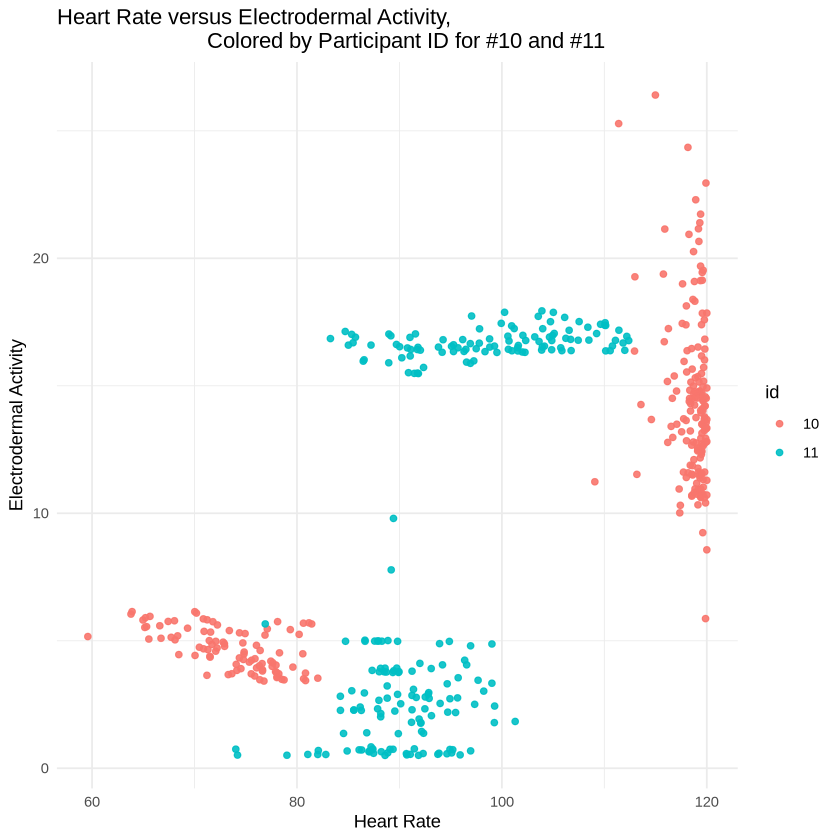

In [79]:
hr_v_eda_pos_cor <- driving_distraction |> filter(id == 10 | id == 11) |> ggplot(aes(x = hr, y = eda, color = id)) + geom_point(alpha = 0.9) +
                    labs(title = "Heart Rate versus Electrodermal Activity, 
                         Colored by Participant ID for #10 and #11",
                        x = "Heart Rate", y = "Electrodermal Activity") +
                        theme_minimal()
hr_v_eda_pos_cor

These graphs show us some interesting insights about highly correlated individuals. Most critically, this high correlation coefficient for both participant 10 and 11 isn't coming from a straight linear relation as expected, but rather odd discrete clusters per individual.

I was curious if maybe these clusters were being caused by different tasks, which the paper focuses on identifying as causes of stress.


Warning message:
“Removed 110 rows containing missing values or values outside the scale range
(`geom_point()`).”


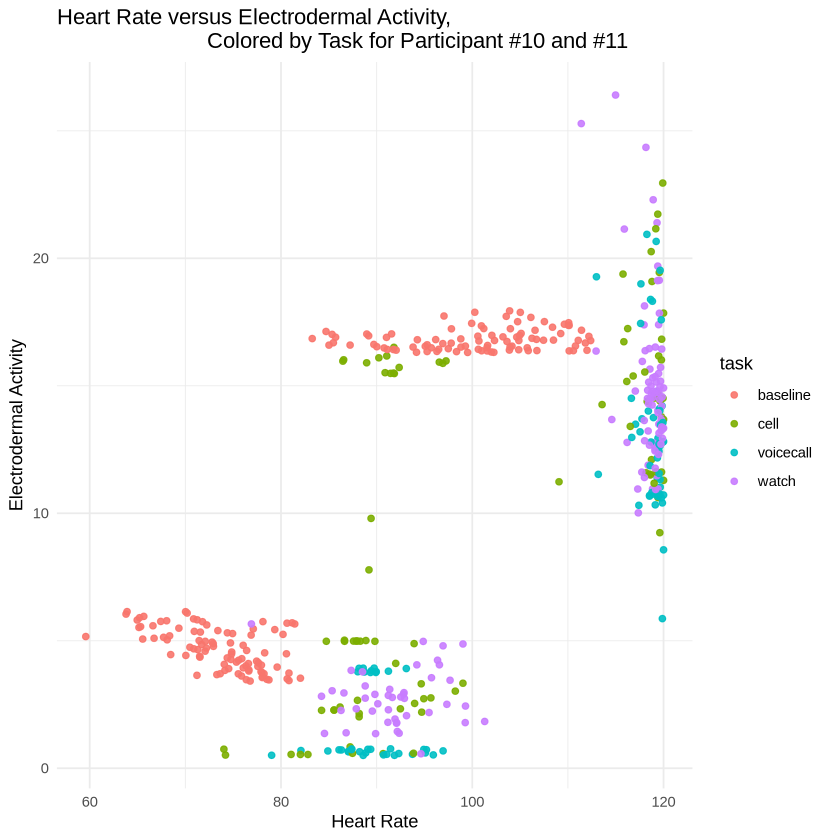

In [80]:
hr_v_eda_by_task <- driving_distraction |> filter(id == 10 | id == 11) |> ggplot(aes(x = hr, y = eda, color = task)) + geom_point(alpha = 0.9) +
                    labs(title = "Heart Rate versus Electrodermal Activity, 
                         Colored by Task for Participant #10 and #11",
                        x = "Heart Rate", y = "Electrodermal Activity") +
                        theme_minimal()
hr_v_eda_by_task


These results were bizarre. For participant 10, it seems only one task was measured, so the reason for the jump in EDA and heart rate is unknown. For participant 11, there seems to be an evenly distributed number of measurements per task in each cluster, meaning that the jump in heart rate isn't necessarily correlated to task, either. I'd guess that the correct way to interpret this in the case of participant 11 a similar stress response was found regardless of the texting method.


### Further Questions

> Think of a research question you would like to explore using this dataset if you were the author of this paper. Write your question in one or two sentences in simple and plain language. (Reasoning: 4 points)

Can we predict whether a driver is participating in a distracting task (such as texting) based on their physiological signals, including heart rate and electrodermal activity?

> Based on the question you wrote do you think you need to do the splitting of your data into train and test? Answer in two or three sentences. (Reasoning: 4 points)

Since this is a prediction task, a train–test split is needed! My goal would be to build a model that predicts the type or level of distraction from physiological data, so we'd need to evaluate how well the model can predict on unseen observations.

> Considering your dataset and research question, create a new feature derived from the existing variables in your dataset that could help you answer your question. Describe how you constructed this variable and explain why you think it will be useful. (Reasoning: 2 points + Coding: 2 points)

I want to maybe combine physiological responses to create a different feature, as previous graphs showed our current physiological measurements don't necessarily show any relation to `task`. We might want to consider a ratio of `eda` to `hr`, for example, because different distraction types could produce different physiological ratios. 

A reason this might help is because different tasks in this experiment require different physical behaviours from participants. Texting while driving requires motor control and visual attention, which might produce high EDA (sweaty palms) but not elevate heart rate, giving a high ratio. Recieving a voice notification would involve thinking harder but less physical interaction, which might produce less EDA and some increased heart rate, resulting in a medium ratio. Baseline driving represents a relaxed state with low EDA and normal heart rate, which would give a low ratio. 

We could define it simply.


In [81]:
arousal_ratio <- driving_distraction |> mutate(arousal_ratio = eda / hr)


We can take a quick glimpse at what this might look like by adapting a boxplot I used previously in this case study. Our graph shows a larger range of medians than when we considered just heart rate and task, which might be a sign this new feature would be a more useful physiological measure to help us predict the type of distraction a participant is engaged with.

Warning message:
“Removed 739 rows containing non-finite outside the scale range
(`stat_boxplot()`).”


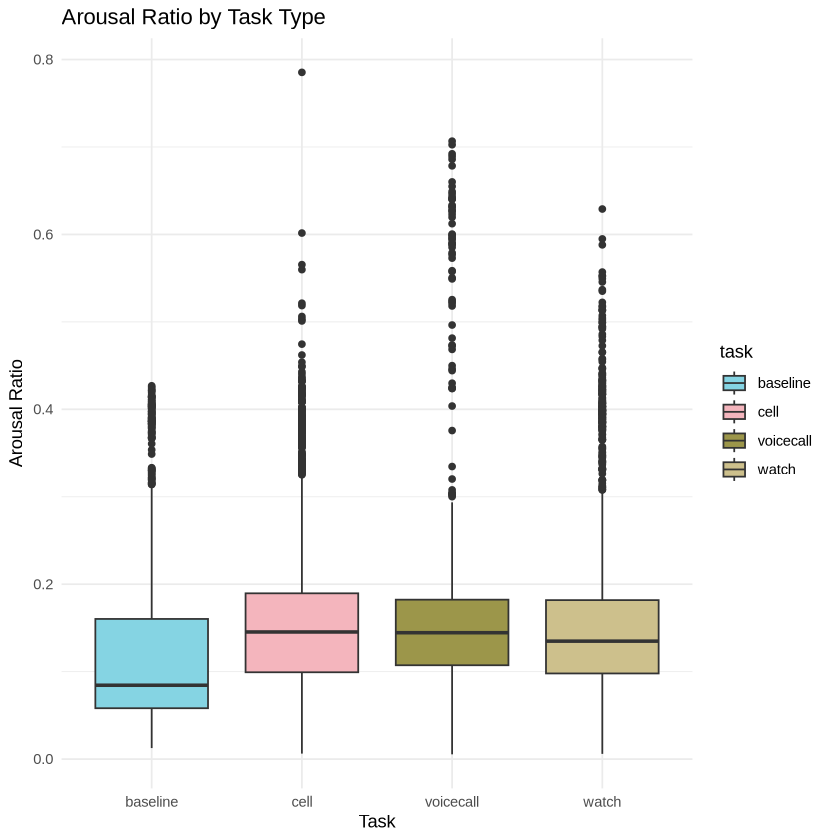

In [82]:

arousal_graph <- arousal_ratio |>
  ggplot(aes(x = task, y = arousal_ratio, fill = task)) +
  geom_boxplot() +
  scale_fill_manual(values = wesanderson::wes_palette("Moonrise3")) +
  labs(title = "Arousal Ratio by Task Type",
    x = "Task",
    y = "Arousal Ratio") +
    theme_minimal()

arousal_graph


## Sampling and Study Design

### Question Types

>What type of data analysis questions are the authors of the paper hoping to answer? Recall the different types of data analysis questions you learned in DSCI 100 (e.g., descriptive, inferential, predictive, causal, exploratory). Which category or categories best describe the authors’ goals? (Reasoning: 5 points)

What types of questions were asked in this study? Let's refer back to the definitons from [our trusty Data Science 100 textbook](https://datasciencebook.ca/intro.html#asking-a-question).

**DESCRIPTIVE: A question that asks about summarized characteristics of a data set without interpretation (i.e., report a fact).**

This study summarizes characteristics of distraction, driving performance, and mental workload under different conditions (smartwatch, mobile phone, speaker, texting). The kind of statements that came from this were of the type of: "participants were more distracted in the smartwatch condition than the phone condition".

**INFERENTIAL: A question that looks for patterns, trends, or relationships in a single data set and also asks for quantification of how applicable these findings are to the wider population.**

This study compared conditions with the aim to generalize findings beyond their 31 participants. This type of question is what leads to conclusions of the type of: "smartwatches are generally more distracting than phones".

**CAUSAL: A question that asks about whether changing one factor will lead to a change in another factor, on average, in the wider population.**	

Arguably, this is the most important type of question asked in this study. The researchers manipulated device and message type for each participant in a controlled experiment with the hopes of observing the effects of these changes while keeping other factors constant. These experiments were designed to determine whether the type of device (smartwatch, mobile phone, speaker) or message format (text vs. voice) directly caused driver distraction and performance. 

### Population v. Sample
> Describe the population and sample used in this study. Clearly define both the population of interest and the sample that was actually observed in the study. (Reasoning: 5 points)

Let's look at our population of interest more closely: 

**Population**: The population of interest is all drivers who might use smartwatches, mobile phones, or voice devices while driving. The researchers want to understand how these devices affect distraction and driving performance for drivers in general.

**Sample**: The sample actually observed in the study consisted of 31 participants who took part in a driving simulator experiment, where they received and responded to text or voice messages under four different conditions (smartwatch, mobile phone, speaker, and texting).

### Controlled or Observed?

> Was this an observational study or controlled experiment study? Explain your reasoning using relevant terminology. (Reasoning: 5 points)

This was a controlled experiment!

The researchers manipulated the type of device and message type (smartwatch, mobile phone, speaker, texting) for each participant. The driving was done in a simulator, replicating the driving experience in a repeatable way. By controlling these conditions and observing the resulting distraction and driving performance, they could test the causal effect of changing device or message type. Unlike an observational study, where researchers only measure variables without intervention, this study actively assigned treatments and controlled the environment through a driving simulator to isolate the effects of each condition. 

### Confounding Variables

>Did researchers control for any confounding variable in this study? If yes explain how. If no, can you think of any potential confounding variable that you can adjust for? Explain your reasoning. (Reasoning: 5 points)

The researchers controlled for individual differences in driving ability and distraction by using a within-subject design, where all participants take part in every condition*. This design reduces variability caused by participant characteristics because each person serves as their own control. 

*In this specific dataset, we don't have the data for all participants in every condition, as was discovered above. For example, Participant 10 doesn't have recorded data on any conditions other than the baseline, and there is an observed class imbalance.

### Sampling Method

> What type of sampling method did the authors use? Cite the section of the paper where the sampling method is described or being inferred. Why do you think the authors chose this method over others? (Reasoning: 5 points)

In Section 3.3.2 of the research paper, the authors describe their use of volunteer sampling and convenience sampling. They recruited volunteers through their institution’s research panel infrastructure. Participants chose to join this study based on its description. Thirty-one participants aged 18–47 were screened for health and driving criteria before participating. The participants were reimbursed with a gift card.

This method was likely chosen for practical reasons. It's incredibly convenient to have an administrative system to process volunteers already built by your institution. By including a brief description of the study, unqualified participants (eg. those without a license) could self-select out in a way that wouldn't be possible with random sampling. 

### Sampling Bias

> Were there any potential sources of sampling bias that may have affected the study’s conclusions? Explain your reasoning. (Reasoning: 5 points)

Using a small volunteer sample from a university research portal does not represent the broader population of drivers, especially in terms of age, driving experience, and familiarity with technology. This sample, like many voluntary research samples in research universities, likely suffers from [WEIRD BIAS](https://www.psychologytoday.com/ca/blog/evolutionary-social-cognition/202410/demographic-acronym-weird-overused-in-psychology-research#:~:text=The%20acronym%20%22WEIRD%22%20stands%20for,populations%20and%20regions%20under%20study.). This is a type of bias that happens due to a greater systematic bias of university students to be Westernized, Educated, Industrialized, Rich, and Democratic. This sampling bias may affect conclusions in many ways, such as (but not limited to) the following:

- The conclusion may not reflect the behaviors of drivers who learned to drive/are driving in countries with more or less strict driving and distracted driving laws.
- The conclusion may not reflect the behaviours of older drivers, who are less comfortable with smartwatches, phones, or texting.
- The conclusion may not reflect the behaviours of drivers with more or less driving experience.
- The conclusion may not reflect the behaviours of drivers in automatic v. manual cars.
  
Overall, these findings may overestimate or underestimate distraction levels for the general population across device and message types.

### What Would I Do?

> If you were to design this study yourself, would you use a different sampling and design method? Why or why not? Reflect on what you might do differently and how your choice of sampling method might affect the results. Additionally, consider why the authors might have chosen not to use alternative sampling or design methods. What are the potential limitations or challenges of your proposed approach? (Reasoning: 10 points)

If I had the chance to design this study again, I think I would change both the sampling method and the experimental design.

If I had an infinite budget and time, I would opt to use stratified random sampling to ensure participants of different ages, backgrounds, genders, and driving experience are included, which would improve generalizability. I would still keep the within-subject design to control for individual differences while testing each condition. The researchers probably avoided this due to time, cost, and logistical constraints, since recruiting a stratified random sample is more resource-intensive, and recruiting from the research portal was the path of least resistance. Under any budget, time, or logistical constraint, I would choose their same sampling method and limit the scope of my conclusions to the behavior of college students. 

For the experiment itself, I might change the driving simulation to a real driving situation, maybe on a track, in a parking lot, or in a closed-off portion of road. This would make the experiment more realistic and likely more representative of real-world behaviour. The researchers probably avoided this due to time, cost, and logistical constraints– but also due to safety, which would be a major concern if distracted driving is induced in a real scenario. I think the real scenario might induce a higher stress response, and in turn create more measurable physiological markers. 


### AI Acknowledgement

All ideas in this case are my own. ChatGPT assisted with some summary statistic calculations when I ran into a bug (often to do with NA values).